In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

plt.style.use('default')

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Problem 1 to 2:**

**Dataset link:** https://rb.gy/gsmddu

**Add a label to every axis and add a proper title for the charts (For every subplot, it is applicable). Also add proper labels if there are multiple representations.** Then, you can customize it as your wish.

### **Problem-1:** Make a subplots which have 2 plots.

- For the first chart, draw a scatter plot "*Monitored Cap.(MW)*" vs "*Total Cap. Under Maintenance (MW)*" of top 5 most frequent power stations. Then draw the lines which indicate the average values of these two columns. Change the colors according to the names of the Power Stations.
- For the second chart, draw a scatter plot "*Monitored Cap. (MW)*" vs "*Actual(MU)*" of the top 5 most frequent power stations. Also draw the lines which indicates the average values of these two columns. Change the colors according to the names of the Power Stations.


In [4]:
pg_df = pd.read_csv("/content/drive/MyDrive/CampusX/Matplotlib/Session_24_Advanced_matplotlib/PowerGeneration.csv")
pg_df.head()

,Dates,Power Station,Monitored Cap.(MW),Total Cap. Under Maintenace (MW),Planned Maintanence (MW),Forced Maintanence(MW),Other Reasons (MW),Programme or Expected(MU),Actual(MU),Excess(+) / Shortfall (-),Deviation
0,2017-09-01,Delhi,2235.4,135.00,0.00,135.0,0,13,18,5.00,0.0
1,2017-09-01,Haryana,2720.0,2470.00,0.00,2470.0,0,28,7,-21.80,0.0
2,2017-09-01,Himachal Pradesh,3378.0,379.00,0.00,231.0,0,40,46,5.63,0.0
3,2017-09-01,Jammu and Kashmir,1285.0,150.00,0.00,0.0,0,14,23,9.43,0.0
4,2017-09-01,Punjab,3826.3,2697.65,77.65,2620.0,0,39,17,-21.69,0.0


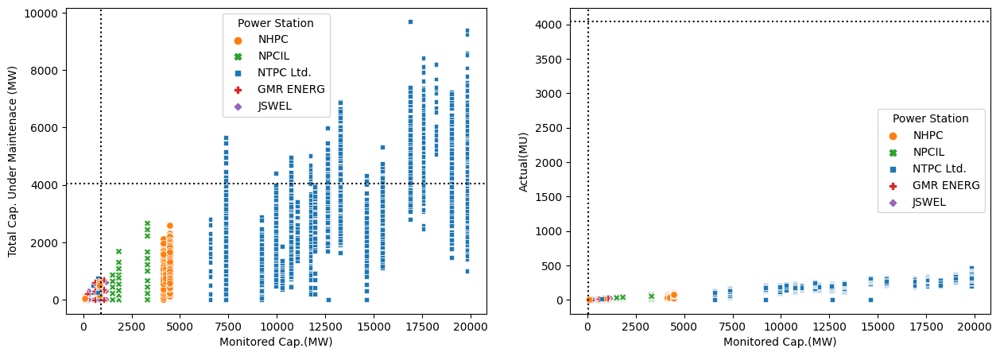

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# load your dataset

# get top 5 most frequent power stations
top_5_stations = pg_df['Power Station'].value_counts().head(5).index

# filter dataset to only contain top 5 power stations
pg_df_top_5 = pg_df[pg_df['Power Station'].isin(top_5_stations)]

# create a color map for each power station
color_map = {station: sns.color_palette()[i] for i, station in enumerate(top_5_stations)}

# create a subplot with 2 charts
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# chart 1: scatter plot "Monitored Cap.(MW)" vs "Total Cap. Under Maintenance (MW)"
sns.scatterplot(data=pg_df_top_5, x='Monitored Cap.(MW)', y='Total Cap. Under Maintenace (MW)', hue='Power Station', style='Power Station', palette=color_map, ax=axs[0])

# add line for average of "Monitored Cap.(MW)"
axs[0].axhline(pg_df_top_5['Monitored Cap.(MW)'].mean(), color='black', linestyle='dotted')
# add line for average of "Total Cap. Under Maintenance (MW)"
axs[0].axvline(pg_df_top_5['Total Cap. Under Maintenace (MW)'].mean(), color='black', linestyle='dotted')

# chart 2: scatter plot "Monitored Cap.(MW)" vs "Actual(MU)"
sns.scatterplot(data=pg_df_top_5, x='Monitored Cap.(MW)', y='Actual(MU)', hue='Power Station', style='Power Station', palette=color_map, ax=axs[1])

# add line for average of "Monitored Cap.(MW)"
axs[1].axhline(pg_df_top_5['Monitored Cap.(MW)'].mean(), color='black', linestyle='dotted')
# add line for average of "Actual(MU)"
axs[1].axvline(pg_df_top_5['Actual(MU)'].mean(), color='black', linestyle='dotted')

plt.show()


In [10]:
#Using plotly
import plotly.graph_objects as go

# get top 5 most frequent power stations
top_5_stations = pg_df['Power Station'].value_counts().head(5).index

# filter dataset to only contain top 5 power stations
pg_df_top_5 = pg_df[pg_df['Power Station'].isin(top_5_stations)]

# create a color map for each power station
color_map = {station: sns.color_palette()[i] for i, station in enumerate(top_5_stations)}

fig = go.Figure(data=[
    go.Scatter(
        x = pg_df_top_5[pg_df_top_5["Power Station"] == i]["Monitored Cap.(MW)"],
        y = pg_df_top_5[pg_df_top_5["Power Station"] == i]["Total Cap. Under Maintenace (MW)"],
        mode = 'markers',
        name = i,
        marker = dict(size=4, color=color_map[i])
    ) for i in top_5_stations
])

fig.update_layout(
    xaxis_title="Monitored Cap.(MW)",
    yaxis_title="Total Cap. Under Maintenace (MW)",
    width=700,
    height=400,
    showlegend=True)

fig.add_trace(go.Scatter(x=[pg_df_top_5["Monitored Cap.(MW)"].mean()], 
                         y=[pg_df_top_5["Total Cap. Under Maintenace (MW)"].mean()],
                         mode='lines',
                         line=dict(width=2, color='black')))


fig2 = go.Figure(data=[
    go.Scatter(
        x = pg_df_top_5[pg_df_top_5["Power Station"] == i]["Monitored Cap.(MW)"],
        y = pg_df_top_5[pg_df_top_5["Power Station"] == i]["Actual(MU)"],
        mode = 'markers',
        name = i,
        marker = dict(size=4, color=color_map[i])
    ) for i in top_5_stations
])

fig2.update_layout(
    xaxis_title="Monitored Cap.(MW)",
    yaxis_title="Actual(MU)",
    width=700,
    height=400,
    showlegend=True)

fig2.add_trace(go.Scatter(x=[pg_df_top_5["Monitored Cap.(MW)"].mean()], 
                         y=[pg_df_top_5["Actual(MU)"].mean()],
                         mode='lines',
                         line=dict(width=2, color='black')))

fig.show()
fig2.show()


In [5]:
pg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 345273 entries, 0 to 345272
Data columns (total 11 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Dates                             345273 non-null  object 
 1   Power Station                     345273 non-null  object 
 2   Monitored Cap.(MW)                345273 non-null  float64
 3   Total Cap. Under Maintenace (MW)  345273 non-null  float64
 4   Planned Maintanence (MW)          345273 non-null  float64
 5   Forced Maintanence(MW)            345273 non-null  float64
 6   Other Reasons (MW)                345273 non-null  int64  
 7   Programme or Expected(MU)         345273 non-null  int64  
 8   Actual(MU)                        345273 non-null  int64  
 9   Excess(+) / Shortfall (-)         345273 non-null  float64
 10  Deviation                         345273 non-null  float64
dtypes: float64(6), int64(3), object(2)
memory usage: 29.

In [ ]:
# code here

### **Problem-2:** Draw a 3D Scatter plot between "*Monitored Cap.(MW)*", "*Total Cap. Under Maintenace (MW)*" and "*Forced Maintanence(MW)*"

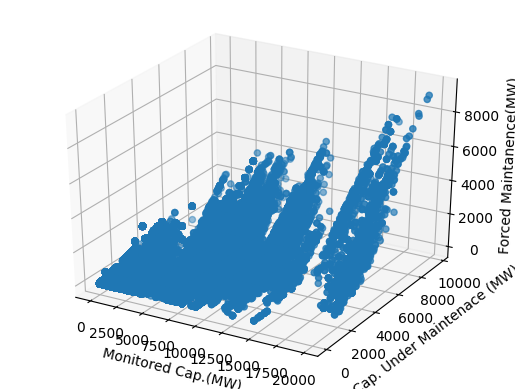

In [7]:
# code here
from mpl_toolkits.mplot3d import Axes3D

# create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pg_df['Monitored Cap.(MW)'], pg_df['Total Cap. Under Maintenace (MW)'], pg_df['Forced Maintanence(MW)'])

ax.set_xlabel('Monitored Cap.(MW)')
ax.set_ylabel('Total Cap. Under Maintenace (MW)')
ax.set_zlabel('Forced Maintanence(MW)')

plt.show()


In [9]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=pg_df['Monitored Cap.(MW)'],
    y=pg_df['Total Cap. Under Maintenace (MW)'],
    z=pg_df['Forced Maintanence(MW)'],
    mode='markers',
    marker=dict(size=4, color='red')
)])

fig.update_layout(scene = dict(
                    xaxis_title='Monitored Cap.(MW)',
                    yaxis_title='Total Cap. Under Maintenace (MW)',
                    zaxis_title='Forced Maintanence(MW)',),
                 width=700,
                 height=700)
fig.show()


### **Problem-3:** Make a 3D *Surface* plot of this below mathematical equation.

$$z = |x| - |y|$$

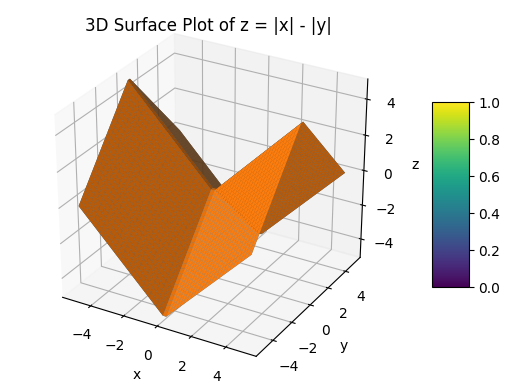

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# create a grid of x and y values
x = np.linspace(-5, 5, 50)
y = np.linspace(-5, 5, 50)
X, Y = np.meshgrid(x, y)

# calculate z values using the given equation
Z = np.abs(X) - np.abs(Y)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.plot_surface(X, Y, Z)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

# Add title
ax.set_title("3D Surface Plot of z = |x| - |y|")

# Add colorbar
fig.colorbar(ax.plot_surface(X, Y, Z), shrink=0.5, aspect=5)

plt.show()


In [18]:
import numpy as np
import plotly.graph_objs as go

# create a grid of x and y values
x = np.linspace(-5, 5, 50)
y = np.linspace(-5, 5, 50)
X, Y = np.meshgrid(x, y)

# calculate z values using the given equation
Z = np.abs(X) - np.abs(Y)

fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])

fig.update_layout(scene = dict(
                    xaxis_title='x',
                    yaxis_title='y',
                    zaxis_title='z',),
                 width=700,
                 height=700)
fig.show()


### **Problem-4:** Draw the 3D *Contour plot* of this below equation:

$$z = |x| - |y|$$

/usr/local/lib/python3.8/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



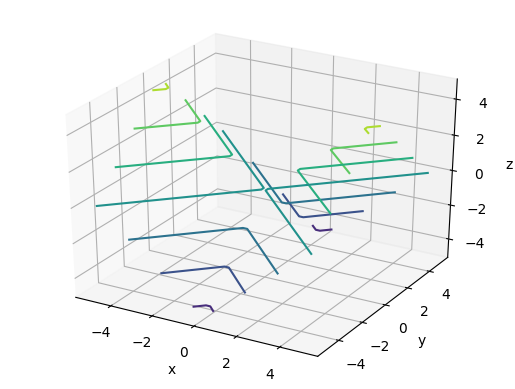

In [14]:
# code here
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# create a grid of x and y values
x = np.linspace(-5, 5, 50)
y = np.linspace(-5, 5, 50)
X, Y = np.meshgrid(x, y)

# calculate z values using the given equation
Z = np.abs(X) - np.abs(Y)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.contour(X, Y, Z)

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

plt.show()


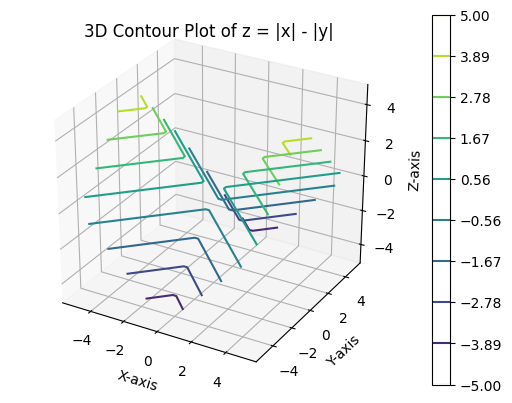

In [15]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

cs = ax.contour(X, Y, Z, levels=np.linspace(-5, 5, 10))

# Add x, y, z axis labels
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

# Add plot title
ax.set_title("3D Contour Plot of z = |x| - |y|")

# Add colorbar
plt.colorbar(cs)

plt.show()


In [16]:
#using plotly
import plotly.graph_objects as go

# Create x, y, z data
x = np.linspace(-5, 5, 50)
y = np.linspace(-5, 5, 50)
X, Y = np.meshgrid(x, y)
Z = np.abs(X) - np.abs(Y)

# Create 3D contour plot
fig = go.Figure(data=[go.Contour(x=x, y=y, z=Z)])
fig.update_layout(scene = dict(
                    xaxis_title='X-axis',
                    yaxis_title='Y-axis',
                    zaxis_title='Z-axis'),
                 width=700,
                 height=700)
fig.show()


### **Problem-5:** Draw a second type of Countour plot of the below equation:

$$z = |x| - |y|$$

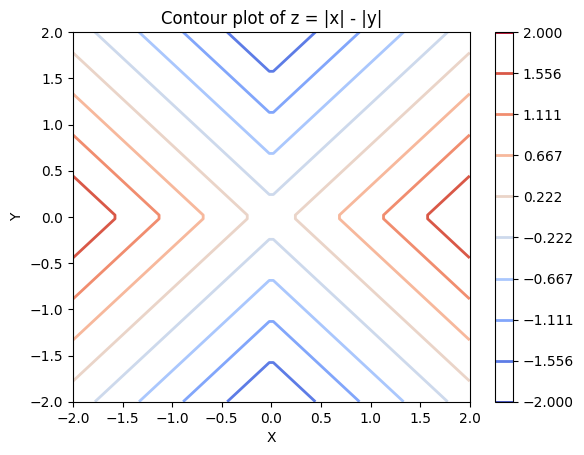

In [3]:
# code here
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x, y)
Z = np.abs(X) - np.abs(Y)

plt.contour(X, Y, Z, levels=np.linspace(-2, 2, 10), cmap='coolwarm', linewidths=2, linestyles='solid')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Contour plot of z = |x| - |y|')
plt.colorbar()
plt.show()


In [4]:
#Using plotly
import plotly.graph_objects as go
import numpy as np

x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x, y)
Z = np.abs(X) - np.abs(Y)

fig = go.Figure(data=[go.Contour(z=Z, x=x, y=y, colorscale='Viridis')])
fig.update_layout(title='Contour plot of z = |x| - |y|',
                  xaxis_title='X',
                  yaxis_title='Y')
fig.show()


## `Problem 6-7`

Data Set Link - https://docs.google.com/spreadsheets/d/17tUL2yC7MGvo7txuuhLtAI-b6_C4jc0t7FLFxqRm-uI/edit?usp=share_link


**Description of Dataset:**

* Date: It gives the date of which stocks details are given.
* Symbol: Name of stock
* Open: It gives the opening price of stock on that date.
* High: It gives the highest price to which the stock ascened on that day.
* Low: It gives the highest price to which the stock plummeted on that day.
* Close: It gives the closing price of stock on that date.
* Volume: It gives the amount of stock traded on that date.
* VWAP: The volume-weighted average price (VWAP) is a statistic used by traders to determine what the average price is based on both price and volume.
* Turnover: 

In [6]:
nifty_df = pd.read_csv("/content/drive/MyDrive/CampusX/Matplotlib/Session_24_Advanced_matplotlib/nifty-50.csv")
nifty_df.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades
0,2000-01-03,HDFCBANK,EQ,157.40,166.00,170.00,166.00,170.00,170.00,169.52,33259,5.638122e+11,NaN
1,2000-01-04,HDFCBANK,EQ,170.00,182.00,183.45,171.00,174.00,173.80,174.99,168710,2.952261e+12,NaN
2,2000-01-05,HDFCBANK,EQ,173.80,170.00,173.90,165.00,168.00,166.95,169.20,159820,2.704094e+12,NaN
3,2000-01-06,HDFCBANK,EQ,166.95,168.00,170.00,165.30,168.95,168.30,168.44,85026,1.432166e+12,NaN
4,2000-01-07,HDFCBANK,EQ,168.30,162.15,171.00,162.15,170.75,168.35,166.79,85144,1.420158e+12,NaN


In [7]:
nifty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480996 entries, 0 to 480995
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Date        480996 non-null  object 
 1   Symbol      480996 non-null  object 
 2   Series      480996 non-null  object 
 3   Prev Close  480996 non-null  float64
 4   Open        480996 non-null  float64
 5   High        480996 non-null  float64
 6   Low         480996 non-null  float64
 7   Last        480996 non-null  float64
 8   Close       480996 non-null  float64
 9   VWAP        480996 non-null  float64
 10  Volume      480996 non-null  int64  
 11  Turnover    480996 non-null  float64
 12  Trades      245600 non-null  float64
dtypes: float64(9), int64(1), object(3)
memory usage: 47.7+ MB


### `Problem-6` Use Pandas plot functions

* Line plot of closing value of top 5 Stocks in Year 2020.
* Take top 5 stocks based on total turnover in Year 2020

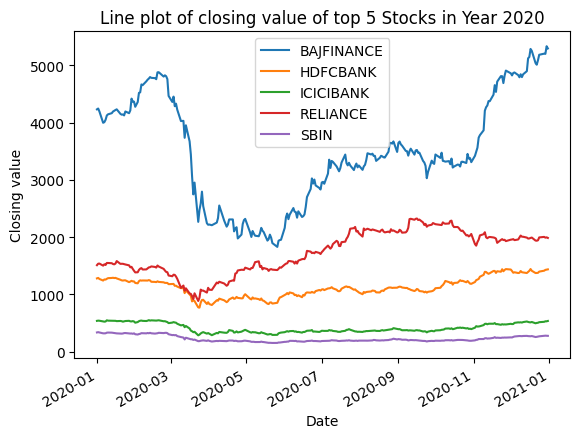

In [9]:
# code here
import pandas as pd

# convert the 'Date' column to datetime format
nifty_df['Date'] = pd.to_datetime(nifty_df['Date'])

# subset data for year 2020
nifty_df_2020 = nifty_df[nifty_df['Date'].dt.year == 2020]

# group by symbol and compute total turnover
nifty_df_2020_grouped = nifty_df_2020.groupby('Symbol')['Turnover'].sum().reset_index()

# sort by total turnover and select top 5 symbols
top_5_symbols = nifty_df_2020_grouped.sort_values('Turnover', ascending=False)['Symbol'].head(5)

# subset data for top 5 symbols
top_5_stocks = nifty_df_2020[nifty_df_2020['Symbol'].isin(top_5_symbols)]

# group by symbol and date and compute mean of close column
top_5_stocks_grouped = top_5_stocks.groupby(['Symbol','Date'])['Close'].mean().reset_index()

# pivot the dataframe to have symbols as columns
top_5_stocks_grouped_pivot = top_5_stocks_grouped.pivot(index='Date',columns='Symbol',values='Close')

# plot the data
top_5_stocks_grouped_pivot.plot()
plt.title('Line plot of closing value of top 5 Stocks in Year 2020')
plt.xlabel('Date')
plt.ylabel('Closing value')
plt.legend(loc='best')
plt.show()


### `Problem-7` Scatter plot Close price vs Volume for TOP-5 Stocks in year 2021
* Color on Symbol Column

In [14]:
# code here
import plotly.graph_objects as go

# convert the 'Date' column to datetime format
nifty_df['Date'] = pd.to_datetime(nifty_df['Date'])

# subset data for year 2021
nifty_df_2021 = nifty_df[nifty_df['Date'].dt.year == 2021]

# group by symbol and compute total turnover
nifty_df_2021_grouped = nifty_df_2021.groupby('Symbol')['Turnover'].sum().reset_index()

# sort by total turnover and select top 5 symbols
top_5_symbols = nifty_df_2021_grouped.sort_values('Turnover', ascending=False)['Symbol'].head(5)

# subset data for top 5 symbols
top_5_stocks = nifty_df_2021[nifty_df_2021['Symbol'].isin(top_5_symbols)]

fig = go.Figure()
for symbol in top_5_symbols:
    fig.add_trace(go.Scatter(x=top_5_stocks[top_5_stocks['Symbol'] == symbol]['Volume'],
                             y=top_5_stocks[top_5_stocks['Symbol'] == symbol]['Close'],
                             mode='markers',
                             name=symbol,
                             marker=dict(size=10, color=symbol)))

fig.update_layout(title='Scatter plot of Close price vs Volume for TOP-5 Stocks in year 2021',
                  xaxis_title='Volume',
                  yaxis_title='Close')
fig.show()


ValueError: ignored

In [16]:

import plotly.colors as pl_colors

# subset data for year 2021
nifty_df_2021 = nifty_df[nifty_df['Date'].dt.year == 2021]

# group by symbol and compute total turnover
nifty_df_2021_grouped = nifty_df_2021.groupby('Symbol')['Turnover'].sum().reset_index()

# sort by total turnover and select top 5 symbols
top_5_symbols = nifty_df_2021_grouped.sort_values('Turnover', ascending=False)['Symbol'].head(5)

# subset data for top 5 symbols
top_5_stocks = nifty_df_2021[nifty_df_2021['Symbol'].isin(top_5_symbols)]

# assign colors to symbol column
colors = pl_colors.qualitative.Plotly[:len(top_5_symbols)]
top_5_stocks['Color'] = top_5_stocks['Symbol'].map(dict(zip(top_5_symbols,colors)))

fig = go.Figure()
for symbol in top_5_symbols:
    fig.add_trace(go.Scatter(x=top_5_stocks[top_5_stocks['Symbol'] == symbol]['Volume'],
                             y=top_5_stocks[top_5_stocks['Symbol'] == symbol]['Close'],
                             mode='markers',
                             name=symbol,
                             marker=dict(size=10, color=top_5_stocks[top_5_stocks['Symbol'] == symbol]['Color'].values[0])))

fig.update_layout(title='Scatter plot of Close price vs Volume for TOP-5 Stocks in year 2021',
                  xaxis_title='Volume',
                  yaxis_title='Close')
fig.show()


<ipython-input-16-434291bda46d>:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### `Problem-8` Create a 3-D Scatter Plot using `time,x,y` on below synthetic data. and give color gradiant on `z`
```
# Create a 3D dataset
time = np.linspace(0, 10, 100)
x = np.sin(time)
y = np.cos(time)
z = time

# Create a DataFrame from the dataset
data = pd.DataFrame({'time': time, 'x': x, 'y': y, 'z': z})
```

In [18]:
# code here
# Create a 3D dataset
time = np.linspace(0, 10, 100)
x = np.sin(time)
y = np.cos(time)
z = time

# Create a DataFrame from the dataset
data = pd.DataFrame({'time': time, 'x': x, 'y': y, 'z': z})
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=data['time'], y=data['x'], z=data['y'], 
                                  mode='markers', marker=dict(size=5, color=data['z'], colorscale='Viridis'))])

fig.update_layout(scene = dict(xaxis_title='time', yaxis_title='x', zaxis_title='y'))
fig.show()


### `Problem 9:` Create a surface plot and the 2 types of the contour plots of the below equation.

$$z = sin(\sqrt{x^2 + y^2})$$


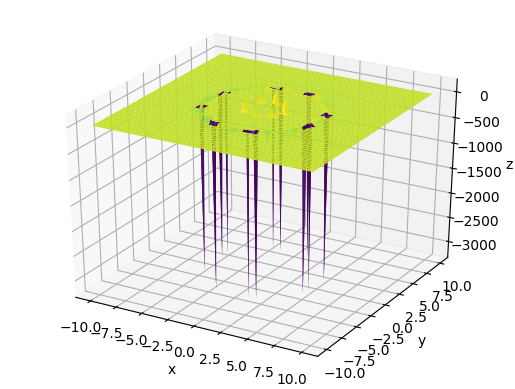

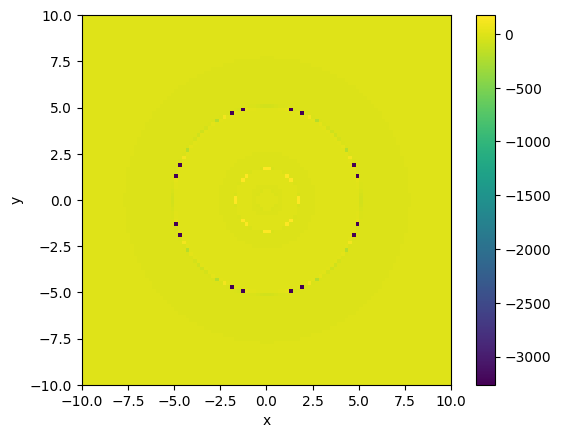

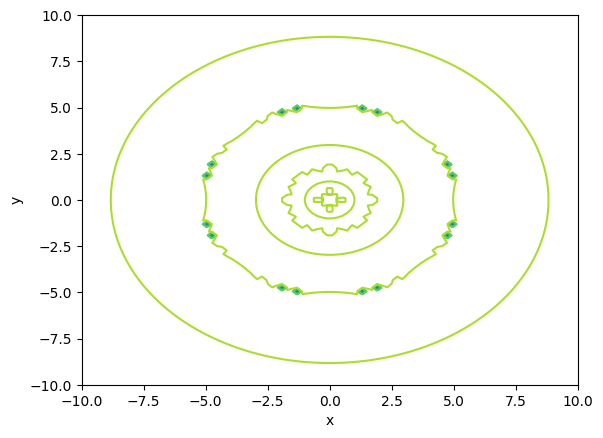

In [19]:
# code here
import matplotlib.pyplot as plt
import numpy as np

# Create a grid of x and y values
x = np.linspace(-10, 10, 100)
y = np.linspace(-10, 10, 100)
x_grid, y_grid = np.meshgrid(x, y)

# Compute the z values
z = np.tan(np.log2(x_grid**2 + y_grid**2))

# Create a surface plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x_grid, y_grid, z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

# Create a contour plot with filled contours
fig, ax = plt.subplots()
im = ax.imshow(z, extent=[x.min(), x.max(), y.min(), y.max()],
               origin='lower', cmap='viridis')
plt.colorbar(im)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()

# Create a contour plot with line contours
fig, ax = plt.subplots()
ax.contour(x_grid, y_grid, z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()


In [20]:
# Using Plotly

import plotly.graph_objects as go
import numpy as np

# Create a grid of x and y values
x = np.linspace(-10, 10, 100)
y = np.linspace(-10, 10, 100)
x_grid, y_grid = np.meshgrid(x, y)

# Compute the z values
z = np.tan(np.log2(x_grid**2 + y_grid**2))

# Create a surface plot
fig = go.Figure(data=[go.Surface(x=x_grid, y=y_grid, z=z, colorscale='Viridis')])
fig.update_layout(scene = dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'))
fig.show()

# Create a contour plot with filled contours
fig = go.Figure(data=[go.Contour(x=x, y=y, z=z, contours=dict(coloring='heatmap'), showscale=True)])
fig.show()

# Create a contour plot with line contours
fig = go.Figure(data=[go.Contour(x=x, y=y, z=z, contours=dict(coloring='lines'), showscale=False)])
fig.show()


### `Problem 10:` Create a surface plot and the 2 types of the contour plots of the below equation.

$$z = tan(\log_2({x^2 + y^2})$$

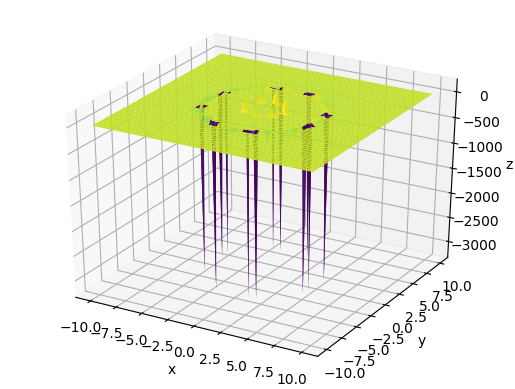

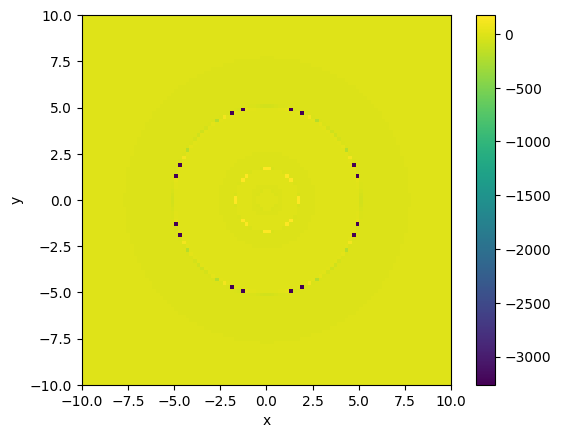

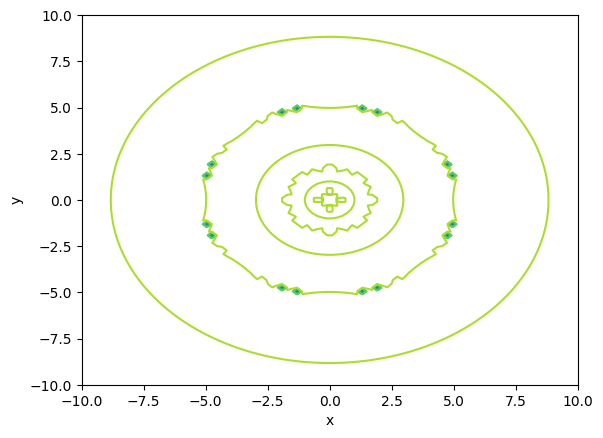

In [21]:
# code here
import matplotlib.pyplot as plt
import numpy as np

# Create a grid of x and y values
x = np.linspace(-10, 10, 100)
y = np.linspace(-10, 10, 100)
x_grid, y_grid = np.meshgrid(x, y)

# Compute the z values
z = np.tan(np.log2(x_grid**2 + y_grid**2))

# Create a surface plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x_grid, y_grid, z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.show()

# Create a contour plot with filled contours
fig, ax = plt.subplots()
im = ax.imshow(z, extent=[x.min(), x.max(), y.min(), y.max()],
               origin='lower', cmap='viridis')
plt.colorbar(im)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()

# Create a contour plot with line contours
fig, ax = plt.subplots()
ax.contour(x_grid, y_grid, z, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()


In [22]:
#using plotly
import plotly.graph_objects as go
import numpy as np

# Create a grid of x and y values
x = np.linspace(-10, 10, 100)
y = np.linspace(-10, 10, 100)
x_grid, y_grid = np.meshgrid(x, y)

# Compute the z values
z = np.tan(np.log2(x_grid**2 + y_grid**2))

# Create a surface plot
fig = go.Figure(data=[go.Surface(x=x_grid, y=y_grid, z=z, colorscale='Viridis')])
fig.update_layout(scene = dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'))
fig.show()

# Create a contour plot with filled contours
fig = go.Figure(data=[go.Contour(x=x, y=y, z=z, contours=dict(coloring='heatmap'), showscale=True)])
fig.show()

# Create a contour plot with line contours
fig = go.Figure(data=[go.Contour(x=x, y=y, z=z, contours=dict(coloring='lines'), showscale=False)])
fig.show()
